# Loading

In [ ]:
!pip install scvelo
!pip install pyomic
!pip install anndata

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached Pyomic-1.1.5-py3-none-any.whl (15.6 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 526.4/526.4 KB 8.4 MB/s eta 0:00:00
  Using cached DateTime-5.0-py3-none-any.whl (52 kB)
  Using cached sklearn-0.0.post1.tar.gz (3.6 kB)
  Preparing metadata (setup.py) ... done
  Using cached ERgene-1.2.8-py3-none-any.whl (3.9 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 KB 19.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.4/261.4 KB 19.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.7/55.7 KB 7.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... canceled
ERROR: Operation cancelled by user
Traceback (most recent call last):
  File "/usr/local/lib/python3

In [ ]:
!pip install --quiet scvi-colab
from scvi_colab import install
!pip install Pygments==2.14.0
install()
import scvi

Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 3021, in _dep_map
    return self.__dep_map
  File "/usr/local/lib/python3.8/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 2815, in __getattr__
    raise AttributeError(attr)
AttributeError: _DistInfoDistribution__dep_map

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/pip/_internal/cli/base_command.py", line 167, in exc_logging_wrapper
    status = run_func(*args)
  File "/usr/local/lib/python3.8/dist-packages/pip/_internal/cli/req_command.py", line 199, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.8/dist-packages/pip/_internal/commands/install.py", line 397, in run
    conflicts = self._determine_conflicts(to_install)
  File "/usr/local/lib/python3.8/dist-packages/pip/_internal/commands/install.py", line 529, i

KeyboardInterrupt: ignored

In [ ]:

#导入包
import anndata
print('anndata(Ver): ',anndata.__version__)
import scanpy as sc
print('scanpy(Ver): ',sc.__version__)
#import scltnn #非必需
#print('scltnn(Ver): ',scltnn.__version__)
import matplotlib.pyplot as plt
import matplotlib
print('matplotlib(Ver): ',matplotlib.__version__)
import seaborn as sns
print('seaborn(Ver): ',sns.__version__)
import numpy as np
print('numpy(Ver): ',np.__version__)
import pandas as pd
print('pandas(Ver): ',pd.__version__)
import scvelo as scv
print('scvelo(Ver): ',scv.__version__)
import Pyomic
print('Pyomic(Ver): ',Pyomic.__version__)

anndata(Ver):  0.8.0
scanpy(Ver):  1.9.2
matplotlib(Ver):  3.5.3
seaborn(Ver):  0.11.2
numpy(Ver):  1.22.4
pandas(Ver):  1.3.5
scvelo(Ver):  0.2.5


ModuleNotFoundError: ignored

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#绘图参数设置
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white')

In [ ]:
sc_color=['#7CBB5F',#浅绿
 '#368650',
 '#A499CC',
 '#5E4D9A',
 '#78C2ED',
 '#866017',
 '#9F987F',
 '#E0DFED',
 '#EF7B77',
 '#279AD7',
 '#F0EEF0',
 '#1F577B',
 '#A56BA7',
 '#E0A7C8',
 '#E069A6',
 '#941456',
 '#FCBC10',
 '#EAEFC5',
 '#01A0A7',
 '#75C8CC',
 '#F0D7BC',
 '#D5B26C',
 '#D5DA48',
 '#B6B812',
 '#9DC3C3',
 '#A89C92',
 '#FEE00C',#深黄
 '#FEF2A1']

In [ ]:
adata = sc.read_h5ad('/content/drive/MyDrive/Gastric/Origin_sc/Gastric_Origin.h5ad')
adata

# 虚假的Batch Size Correction and Data preprocess（用来检测离群细胞）

In [ ]:
#adata = adata[adata.obs.Person != 'HP_POS_1', :]
#adata

In [ ]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [ ]:
adata

AnnData object with n_obs × n_vars = 97180 × 33797
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [ ]:
adata = adata[adata.obs.pct_counts_mt < 30, :]
adata.layers["counts"] = adata.X.copy() # preserve counts
adata.write('/content/drive/MyDrive/Gastric/Data/Gastric_Origin_new.h5ad',compression='gzip')
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


In [ ]:
adata

AnnData object with n_obs × n_vars = 85929 × 33797
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'
    layers: 'counts'

In [ ]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
adata.raw=adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [ ]:
adata = adata[:,adata.var['highly_variable']==True]
adata

View of AnnData object with n_obs × n_vars = 85929 × 2000
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

## Batch size correction

In [ ]:
adata = adata.copy()
# Batch size correction
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="Group_number",
)
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")
vae.train()
latent = vae.get_latent_representation()
adata.obsm["X_scVI"] = latent

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Epoch 59/93:  62%|██████▏   | 58/93 [28:38<17:13, 29.53s/it, loss=113, v_num=1]

In [ ]:
adata

AnnData object with n_obs × n_vars = 85929 × 2000
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_scVI'
    layers: 'counts'

## Preprocess

In [ ]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use


KeyboardInterrupt: ignored

In [ ]:
#sc.tl.pca(adata, n_comps=100, svd_solver="arpack")
sc.pp.neighbors(adata, use_rep="X_scVI", metric="cosine",n_neighbors=20, random_state = 112)
sc.tl.dendrogram(adata, 'Group_number')
ax = sc.pl.correlation_matrix(adata, 'Group_number', figsize=(5,3.5))


In [ ]:
!pip3 install leidenalg

In [ ]:
sc.tl.pca(adata, n_comps=100, svd_solver="arpack")
sc.pp.neighbors(adata, use_rep="X_scVI", metric="cosine",n_neighbors=20, random_state = 112)
sc.tl.leiden(adata)
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata,init_pos='paga')

In [ ]:
sc.pl.umap(adata,color=['leiden'],wspace=0.4)

In [ ]:
adata.write('/content/drive/MyDrive/Gastric/Data/Gastric_anno.h5ad',compression='gzip')

In [ ]:
sc.pl.umap(adata,color=['leiden','Group_number','Sample'],wspace=0.4)

In [ ]:
for i in adata.obs['leiden'].cat.categories:
  number = len(adata.obs[adata.obs['leiden']==i])
  print('the number of category {} is {}'.format(i,number))

In [ ]:
adata = adata[adata.obs[adata.obs['leiden'].astype(int)<44].index]
adata

In [ ]:
sc.pl.umap(adata,color=['leiden','Sample','Group_number'],wspace=0.4,show=False)

# 正式的batch size correction

In [ ]:
adata = sc.read_h5ad('/content/drive/MyDrive/Gastric/Origin_sc/Gastric_Origin.h5ad')
adata

AnnData object with n_obs × n_vars = 103342 × 61363
    obs: 'Group_number', 'Sample'

In [ ]:
adata = adata[adata.obs['Group_number']!='CG01']
adata = adata[adata.obs['Group_number']!='PC01']
adata

View of AnnData object with n_obs × n_vars = 78704 × 61363
    obs: 'Group_number', 'Sample'

In [ ]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

filtered out 4655 cells that have less than 200 genes expressed
filtered out 28804 genes that are detected in less than 3 cells


In [ ]:
adata = adata[adata.obs.pct_counts_mt < 30, :]
adata.layers["counts"] = adata.X.copy() # preserve counts
adata.write('/content/drive/MyDrive/Gastric/Data/Gastric_Origin_new.h5ad',compression='gzip')
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


In [ ]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
adata.raw=adata
adata = adata[:,adata.var['highly_variable']==True]
adata

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:05)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


View of AnnData object with n_obs × n_vars = 63786 × 2000
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [ ]:
adata = adata.copy()
# Batch size correction
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="Group_number",
)
model = scvi.model.SCVI(adata)
model.train()
latent = model.get_latent_representation()
adata.obsm["X_scVI"] = latent

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Epoch 125/125: 100%|██████████| 125/125 [54:16<00:00, 25.44s/it, loss=117, v_num=1]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=125` reached.


Epoch 125/125: 100%|██████████| 125/125 [54:16<00:00, 26.05s/it, loss=117, v_num=1]


In [ ]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata, max_value=10)

regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:04:46)


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:38)
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:14)
Storing dendrogram info using `.uns['dendrogram_Group_number']`


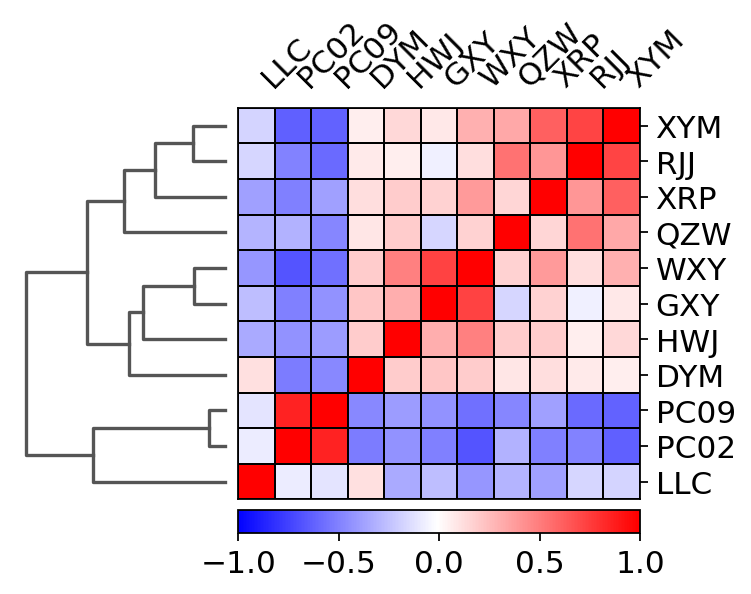

In [ ]:
#sc.tl.pca(adata, n_comps=100, svd_solver="arpack")
sc.pp.neighbors(adata, use_rep="X_scVI", metric="cosine",n_neighbors=20, random_state = 112)
sc.tl.dendrogram(adata, 'Group_number')
ax = sc.pl.correlation_matrix(adata, 'Group_number', figsize=(5,3.5))


In [ ]:
sc.tl.pca(adata, n_comps=100, svd_solver="arpack")
sc.pp.neighbors(adata, use_rep="X_scVI", metric="cosine",n_neighbors=20, random_state = 112)
sc.tl.leiden(adata)
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata,init_pos='paga')

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:00:06)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:44)
running Leiden clustering
    finished: found 64 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:29)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:08)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:00)


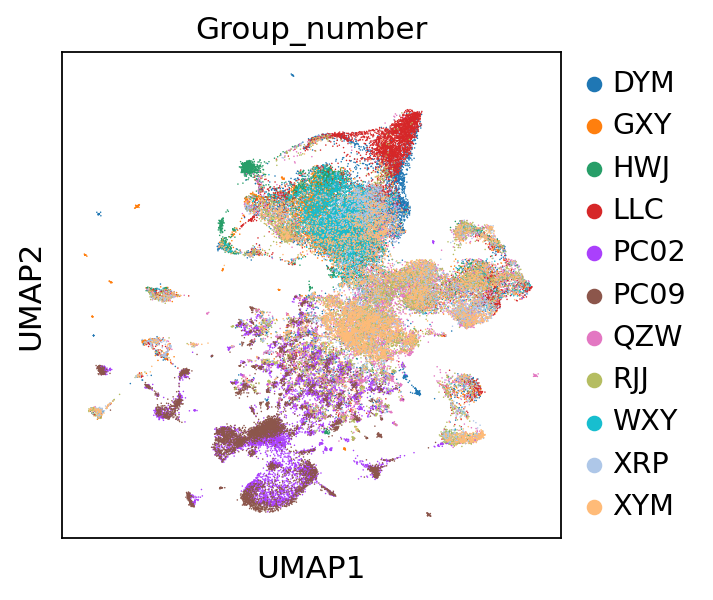

In [ ]:
sc.pl.umap(adata,color=['Sample'],wspace=0.4)

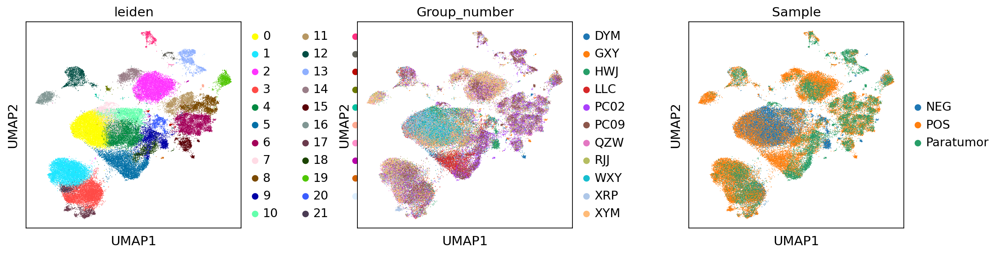

In [ ]:
sc.pl.umap(adata,color=['leiden','Group_number','Sample'],wspace=0.4)

In [ ]:
for i in adata.obs['leiden'].cat.categories:
  number = len(adata.obs[adata.obs['leiden']==i])
  print('the number of category {} is {}'.format(i,number))

the number of category 0 is 8357
the number of category 1 is 6713
the number of category 2 is 6645
the number of category 3 is 5852
the number of category 4 is 4981
the number of category 5 is 4732
the number of category 6 is 3893
the number of category 7 is 2915
the number of category 8 is 2208
the number of category 9 is 2198
the number of category 10 is 2176
the number of category 11 is 1803
the number of category 12 is 1432
the number of category 13 is 1285
the number of category 14 is 1277
the number of category 15 is 1007
the number of category 16 is 985
the number of category 17 is 941
the number of category 18 is 929
the number of category 19 is 909
the number of category 20 is 808
the number of category 21 is 581
the number of category 22 is 485
the number of category 23 is 175
the number of category 24 is 111
the number of category 25 is 105
the number of category 26 is 80
the number of category 27 is 72
the number of category 28 is 48
the number of category 29 is 42
the numb

In [ ]:
adata = adata[adata.obs[adata.obs['leiden'].astype(int)<26].index]
adata

View of AnnData object with n_obs × n_vars = 63503 × 2000
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'dendrogram_Group_number', 'pca', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'Group_number_colors', 'Sample_colors'
    obsm: 'X_scVI', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

[<AxesSubplot:title={'center':'leiden'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Sample'}, xlabel='UMAP1', ylabel='UMAP2'>,
 <AxesSubplot:title={'center':'Group_number'}, xlabel='UMAP1', ylabel='UMAP2'>]

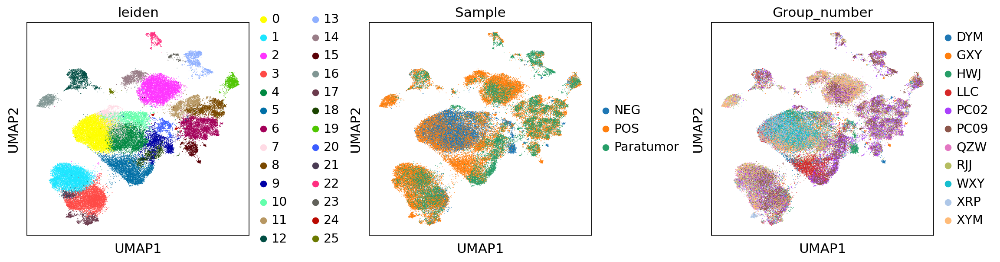

In [ ]:
sc.pl.umap(adata,color=['leiden','Sample','Group_number'],wspace=0.4,show=False)

# Cell anno

In [ ]:
marker_genes_dict = {
    'Epithelial cell':['MUC5AC','MUC1','CDH1'],#上皮细胞
    'B cell(Plasma cell)':['MZB1','DERL3','IGKC'],#浆细胞（B细胞一种）
    'B cell':['CD79A','MS4A1','BANK1'],
    'Endocrine cell':['CHGA','PCSK1N','SCG5'],#内分泌细胞,
    'Myeloid cell':['AIF1','CD68','MS4A7'],#髓系细胞
    'Mast cell':['TPSAB1','TPSB2','CPA3'],#肥大细胞
    'Fibroblast':['DCN','DPT','PDGFRA'],#成纤维细胞
    'NK/T cell':['CD2','CD3E','CD7'], 
    'Smooth muscle cell':['ACTA2','MYH11','ACTG2'],#平滑肌细胞
    'Endothelial cell':['CLDN5','PECAM1','ACKR1'],#内皮细胞
    'Neutrophil':['G0S2','CSF3R','FCGR3B']
}

    using 'X_pca' with n_pcs = 100
Storing dendrogram info using `.uns['dendrogram_leiden']`
categories: 0, 1, 2, etc.
var_group_labels: Epithelial cell, B cell(Plasma cell), B cell, etc.


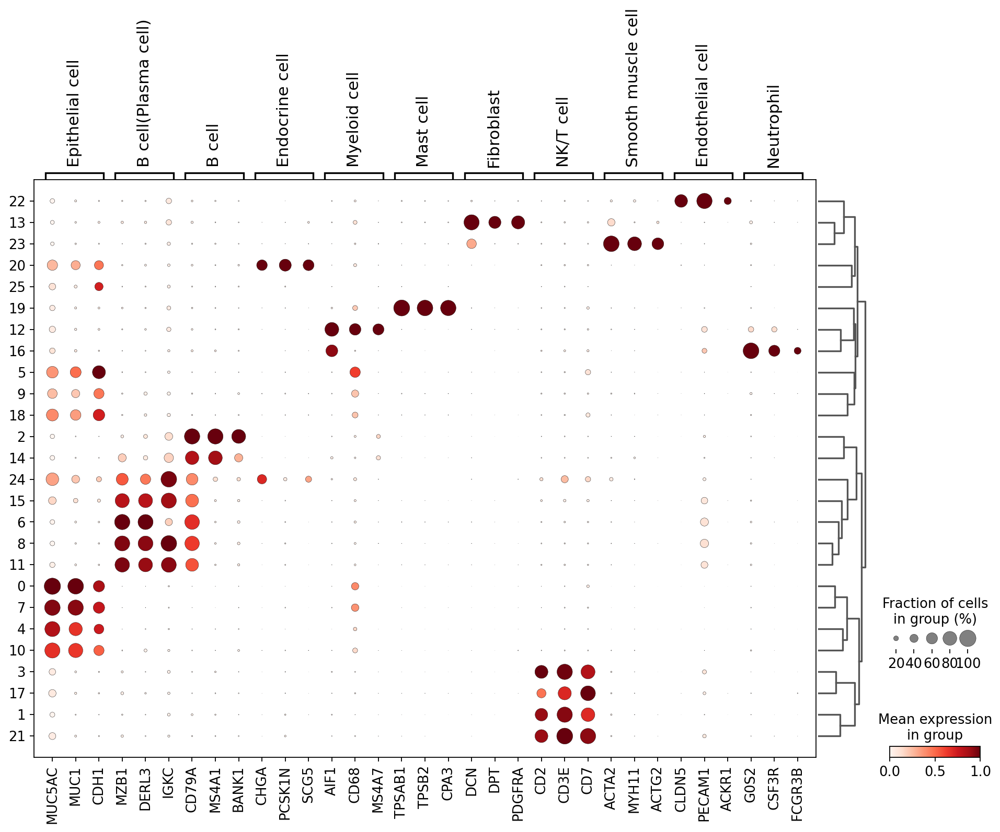

In [ ]:
#sc.tl.dendrogram(adata,'leiden')
sc.pl.dotplot(adata, marker_genes_dict, 'leiden' ,standard_scale='var', dendrogram=True)

In [ ]:
# 25亚群细胞数太少并且不表达相关marker
adata = adata[adata.obs[adata.obs['leiden']!='25'].index]
adata

View of AnnData object with n_obs × n_vars = 63398 × 2000
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'dendrogram_Group_number', 'pca', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'Group_number_colors', 'Sample_colors', 'dendrogram_leiden'
    obsm: 'X_scVI', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [ ]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {
    '0': 'Epithelial cell',#上皮细胞
    '1': 'NK/T cell',
    '2': 'B cell',
    '3': 'NK/T cell',
    '4': 'Epithelial cell',
    '5': 'Epithelial cell',
    '6': 'B cell(Plasma cell)',
    '7': 'Epithelial cell',
    '8': 'B cell(Plasma cell)',
    '9': 'Epithelial cell',
    '10': 'Epithelial cell',
    '11': 'B cell(Plasma cell)',
    '12': 'Myeloid cell',
    '13': 'Fibroblast',
    '14': 'B cell',
    '15': 'B cell(Plasma cell)',
    '16': 'Neutrophil',
    '17': 'NK/T cell',
    '18': 'Epithelial cell',
    '19': 'Mast cell',
    '20': 'Endocrine cell',
    '21': 'NK/T cell',
    '22': 'Endothelial cell',
    '23': 'Smooth muscle cell',
    '24': 'B cell(Plasma cell)',
}
adata.obs['major_celltype'] = adata.obs['leiden'].map(cluster2annotation).astype('category')

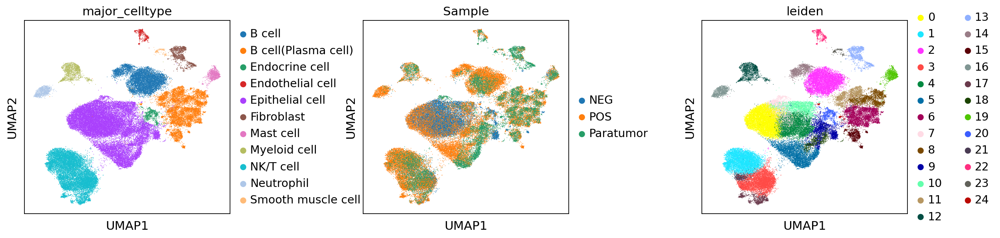

In [ ]:
ax = sc.pl.umap(adata,color=['major_celltype','Sample','leiden'],wspace=0.5,show=False)
plt.savefig('/content/marker.gene.png',dpi=300)

In [1]:
sc.tl.dendrogram(adata,groupby='major_celltype')
sc.pl.dotplot(
    adata,
    marker_genes_dict,
    groupby='major_celltype',
    dendrogram=True,
    color_map="Blues",
    swap_axes=False,
    use_raw=True,
    standard_scale="var",
)

NameError: ignored

In [ ]:
for i in adata.obs['major_celltype'].cat.categories:
  number = len(adata.obs[adata.obs['major_celltype']==i])
  print('the number of category {} is {}'.format(i,number))

the number of category B cell is 7922
the number of category B cell(Plasma cell) is 9022
the number of category Endocrine cell is 808
the number of category Endothelial cell is 485
the number of category Epithelial cell is 26288
the number of category Fibroblast is 1285
the number of category Mast cell is 909
the number of category Myeloid cell is 1432
the number of category NK/T cell is 14087
the number of category Neutrophil is 985
the number of category Smooth muscle cell is 175


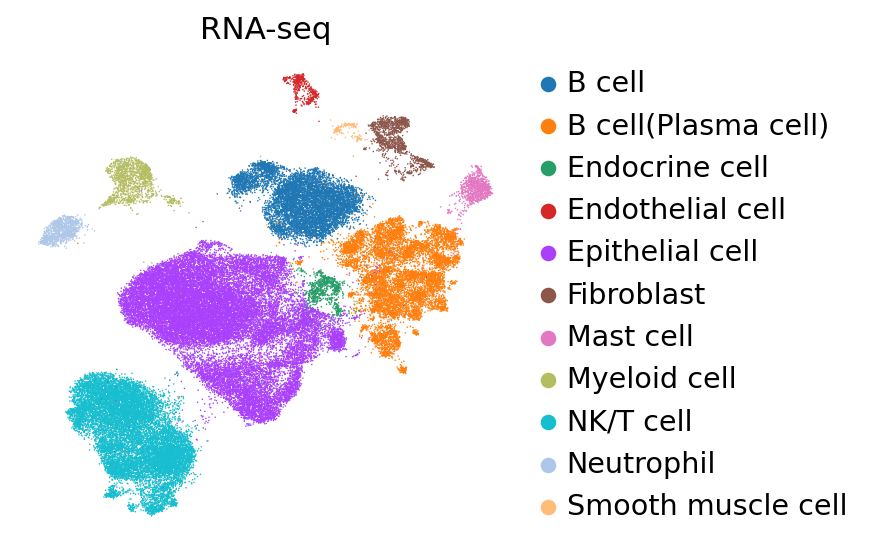

In [ ]:
#pp=plt.figure(figsize=(4,4))
#用ax控制图片
#ax=pp.add_subplot(1,1,1)
ax=sc.pl.embedding(
    adata,
    basis="X_umap",
    color='major_celltype',
    title='RNA-seq',
    frameon=False,
    ncols=3,
    #save='_figure1_celltype.png',
    return_fig=True,
    show=False,
)
#plt.savefig("figure1_celltype_scatac.png",dpi=300,bbox_inches = 'tight')

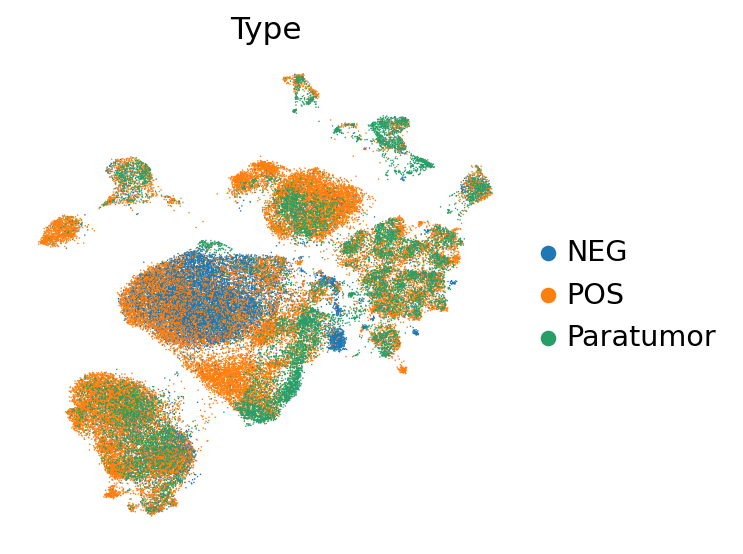

In [ ]:
#pp=plt.figure(figsize=(4,4))
#用ax控制图片
#ax=pp.add_subplot(1,1,1)
ax=sc.pl.embedding(
    adata,
    basis="X_umap",
    color='Sample',
    title='Type',
    frameon=False,
    ncols=3,
    #save='_figure1_celltype.png',
    return_fig=True,
    show=False,
)
#plt.savefig("figure1_celltype_scatac.png",dpi=300,bbox_inches = 'tight')

# color anno

In [ ]:
sc_color=['#7CBB5F',
 '#368650',
 '#A499CC',
 '#5E4D9A',
 '#78C2ED',
 '#866017',
 '#9F987F',
 '#E0DFED',
 '#EF7B77',
 '#279AD7',
 '#F0EEF0',
 '#1F577B',
 '#A56BA7',
 '#E0A7C8',
 '#E069A6',
 '#941456',
 '#FCBC10',
 '#EAEFC5',
 '#01A0A7',
 '#75C8CC',
 '#F0D7BC',
 '#D5B26C',
 '#D5DA48',
 '#B6B812',
 '#9DC3C3',
 '#A89C92',
 '#FEE00C',
 '#FEF2A1']

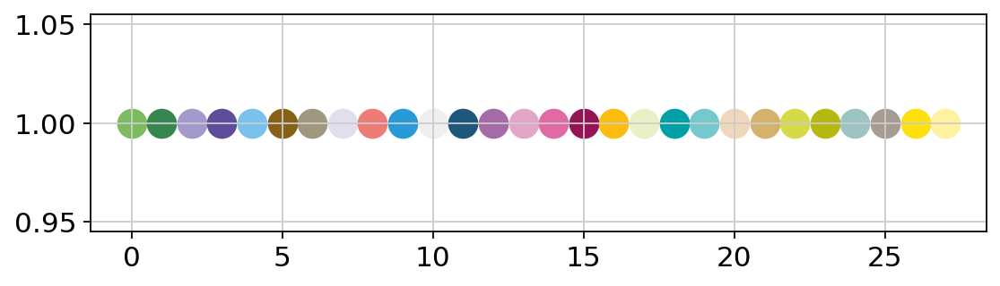

In [ ]:
plt.figure(figsize=(8, 2))
for i in range(len(sc_color)):
    plt.scatter(i, 1, c=sc_color[i], s=200)
plt.show()

In [ ]:
type_color_rna={
    'Epithelial cell':sc_color[16],
    'B cell(Plasma cell)':sc_color[14],
    'B cell':sc_color[15],
    'Endocrine cell':sc_color[0],
    'Myeloid cell':sc_color[3],
    'Mast cell':sc_color[21],
    'Fibroblast':sc_color[8],
    'NK/T cell':sc_color[18],
    'Smooth muscle cell':sc_color[24],
    'Endothelial cell':sc_color[11],
    'Neutrophil':sc_color[9]
}
adata.uns['major_celltype_colors']=adata.obs['major_celltype'].cat.categories.map(type_color_rna).values.tolist()


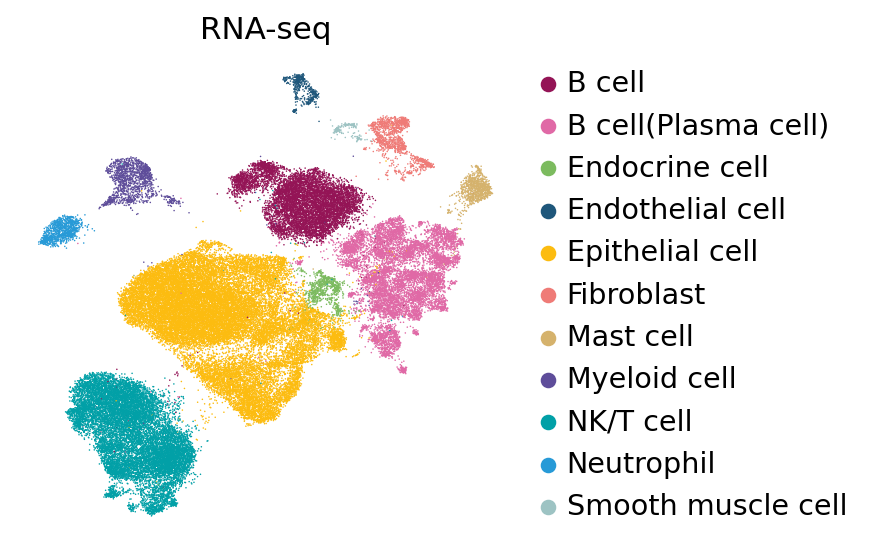

In [ ]:
#pp=plt.figure(figsize=(4,4))
#用ax控制图片
#ax=pp.add_subplot(1,1,1)
ax=sc.pl.embedding(
    adata,
    basis="X_umap",
    color='major_celltype',
    title='RNA-seq',
    frameon=False,
    ncols=3,
    #save='_figure1_celltype.png',
    return_fig=True,
    show=False,
)
#plt.savefig("figure1_celltype_scatac.png",dpi=300,bbox_inches = 'tight')

In [ ]:
!pip install sccoda
from sccoda.util import cell_composition_data as dat
from sccoda.util import data_visualization as viz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# 装载数据
data = adata[adata.obs['Sample']=='POS'].obs['major_celltype'].value_counts().to_frame(name='Pos')
data['Neg'] = adata[adata.obs['Sample']=='NEG'].obs['major_celltype'].value_counts()
data = data.T
data = data.fillna(0)
data['Type'] = data.index
data_adata = dat.from_pandas(data, covariate_columns=["Type"])
print(data_adata.X)
print(data_adata.obs)

[[12371. 10187.  6749.  5543.   935.   894.   470.   331.   293.   243.
     51.]
 [10902.  1500.    30.   397.    23.   101.   113.   362.   107.    28.
     13.]]
    Type
Pos  Pos
Neg  Neg


In [ ]:
# 装载数据
data = adata[adata.obs['Sample']=='POS'].obs['major_celltype'].value_counts().to_frame(name='POS')
data['NEG'] = adata[adata.obs['Sample']=='NEG'].obs['major_celltype'].value_counts()
data = data.T
data = data.fillna(0)
data['Type'] = data.index
data_adata = dat.from_pandas(data, covariate_columns=["Type"])
print(data_adata.X)
print(data_adata.obs)
cell_index = data_adata.var.index

[[12371. 10187.  6749.  5543.   935.   894.   470.   331.   293.   243.
     51.]
 [10902.  1500.    30.   397.    23.   101.   113.   362.   107.    28.
     13.]]
    Type
POS  POS
NEG  NEG


Text(0.5, 1.0, 'scRNA-seq')

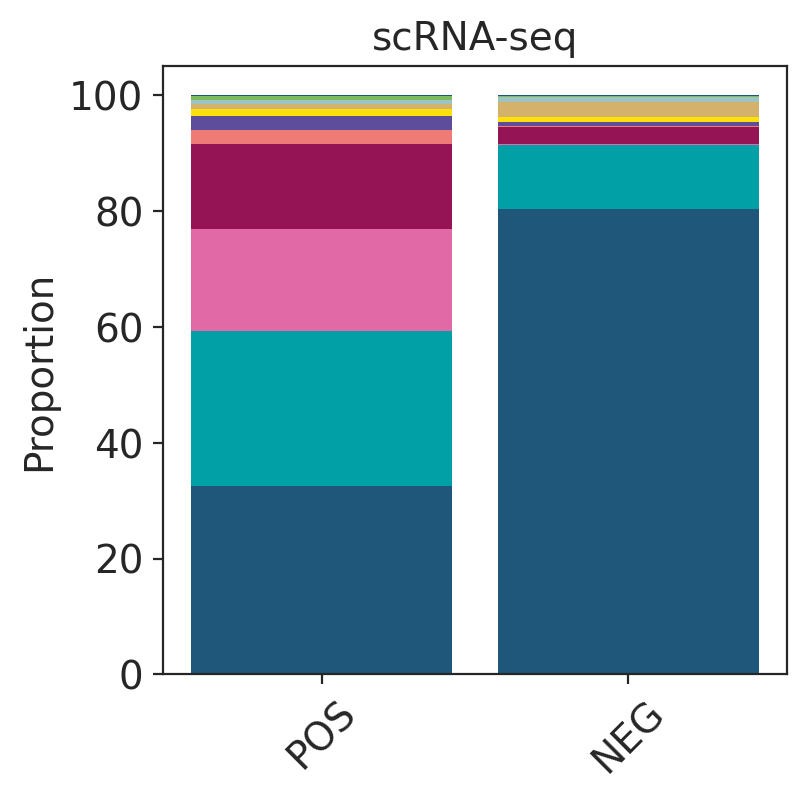

In [ ]:
from matplotlib.colors import ListedColormap, BoundaryNorm
sns.set_style("ticks") #设置全局主题
type_color_T = [sc_color[11],sc_color[18],sc_color[14],sc_color[15],sc_color[8],sc_color[3],sc_color[26],sc_color[21],sc_color[24],sc_color[0]]
viz.stacked_barplot(data_adata, feature_name="samples",figsize=(4,4),plot_legend=False,cmap=ListedColormap(type_color_T))

plt.title("scRNA-seq") #设置标题
#plt.savefig("celltype_prop_A_2.png",dpi=300,bbox_inches = 'tight')
#plt.savefig("/content/drive/MyDrive/Breast_Cancer/Tcell_Figure/celltype_prop_A_2.png",dpi=300,bbox_inches = 'tight')

In [ ]:
for i in adata.obs['Group_number'].cat.categories:
  number = len(adata.obs[adata.obs['Group_number']==i])
  print('the number of category {} is {}'.format(i,number))

the number of category DYM is 5806
the number of category GXY is 4983
the number of category HWJ is 3352
the number of category LLC is 5341
the number of category PC02 is 6099
the number of category PC09 is 5656
the number of category QZW is 8562
the number of category RJJ is 7413
the number of category WXY is 5241
the number of category XRP is 4713
the number of category XYM is 6232


In [ ]:
# 装载数据
data = adata[adata.obs['Group_number']=='HP_POS_2'].obs['major_celltype'].value_counts().to_frame(name='HP_POS_2')
for i in adata.obs['Group_number'].cat.categories:
  data[i] = adata[adata.obs['Group_number']==i].obs['major_celltype'].value_counts()
data = data.T
data = data.fillna(0)
data = data.loc[adata.obs['Group_number'].cat.categories,:]
data = data.loc[:,cell_index]
data['Type'] = data.index
data_adata = dat.from_pandas(data, covariate_columns=["Type"])

print(data_adata.X)
print(data_adata.obs)
print(data_adata.var)

[[3.435e+03 9.320e+02 5.500e+01 9.190e+02 1.100e+01 1.670e+02 8.500e+01
  1.040e+02 5.800e+01 3.100e+01 9.000e+00]
 [3.560e+03 7.600e+02 5.000e+00 2.940e+02 6.000e+00 7.400e+01 6.800e+01
  7.400e+01 1.050e+02 2.500e+01 1.200e+01]
 [2.370e+03 5.570e+02 1.700e+01 9.800e+01 1.400e+01 1.600e+01 3.600e+01
  2.420e+02 0.000e+00 1.000e+00 1.000e+00]
 [3.888e+03 7.470e+02 4.700e+01 2.130e+02 2.300e+01 1.630e+02 1.070e+02
  6.900e+01 6.200e+01 1.500e+01 7.000e+00]
 [1.869e+03 1.073e+03 4.660e+02 1.713e+03 2.500e+01 2.020e+02 1.590e+02
  5.200e+01 3.920e+02 8.900e+01 5.900e+01]
 [1.146e+03 1.327e+03 6.770e+02 1.369e+03 2.000e+00 2.350e+02 1.670e+02
  6.300e+01 4.930e+02 1.250e+02 5.200e+01]
 [9.960e+02 3.093e+03 1.883e+03 2.147e+03 1.180e+02 1.920e+02 6.500e+01
  2.900e+01 2.400e+01 1.200e+01 3.000e+00]
 [9.790e+02 2.479e+03 1.790e+03 1.387e+03 3.510e+02 1.710e+02 1.100e+02
  6.500e+01 1.500e+01 6.200e+01 4.000e+00]
 [4.972e+03 1.830e+02 8.000e+00 5.000e+00 3.000e+00 1.100e+01 9.000e+00
  4.600e

Text(0.5, 1.0, 'scRNA-seq')

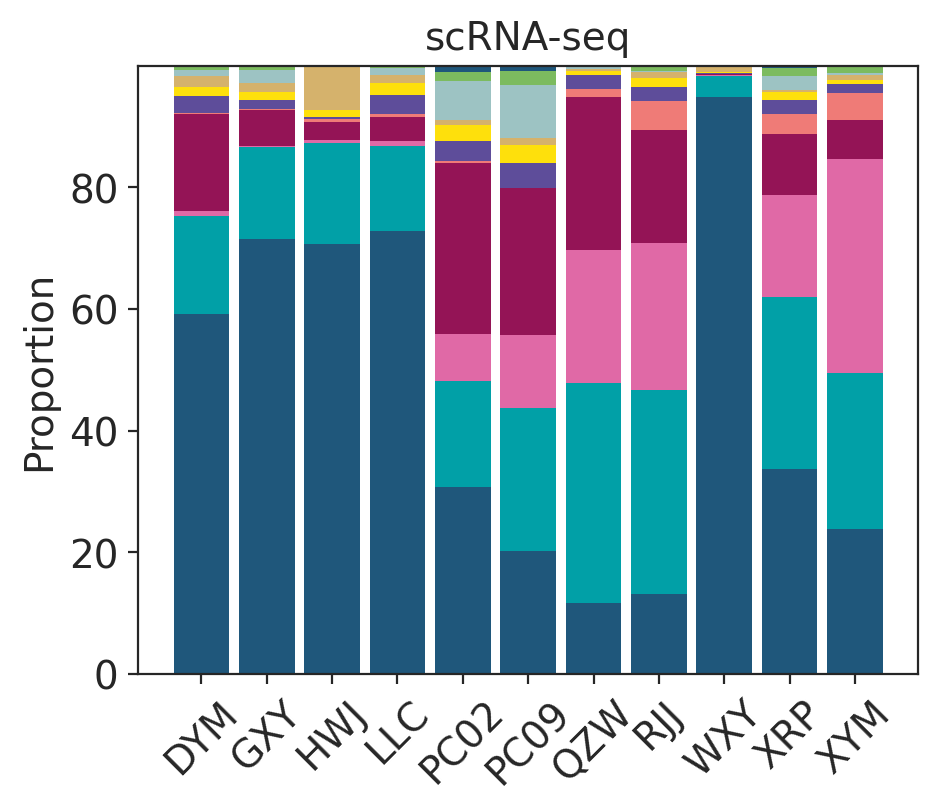

In [ ]:
from matplotlib.colors import ListedColormap, BoundaryNorm
sns.set_style("ticks") #设置全局主题
type_color_T = [sc_color[11],sc_color[18],sc_color[14],sc_color[15],sc_color[8],sc_color[3],sc_color[26],sc_color[21],sc_color[24],sc_color[0]]
viz.stacked_barplot(data_adata, feature_name="samples",figsize=(5,4),plot_legend=False,cmap=ListedColormap(type_color_T))

plt.title("scRNA-seq") #设置标题
#plt.savefig("celltype_prop_A_2.png",dpi=300,bbox_inches = 'tight')
#plt.savefig("/content/drive/MyDrive/Breast_Cancer/Tcell_Figure/celltype_prop_A_2.png",dpi=300,bbox_inches = 'tight')

# Gene expression

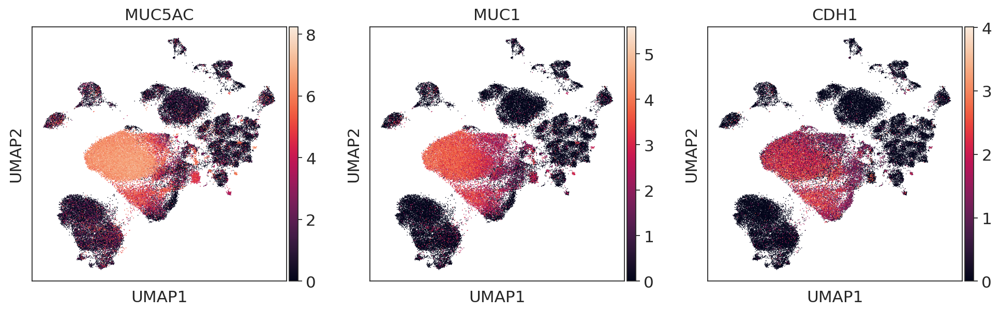

In [ ]:
sc.pl.umap(adata, color=['MUC5AC','MUC1','CDH1'])

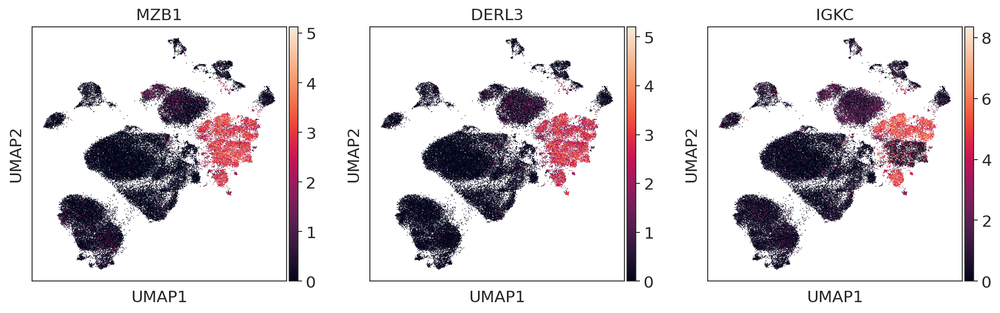

In [ ]:
sc.pl.umap(adata, color=['MZB1','DERL3','IGKC'])

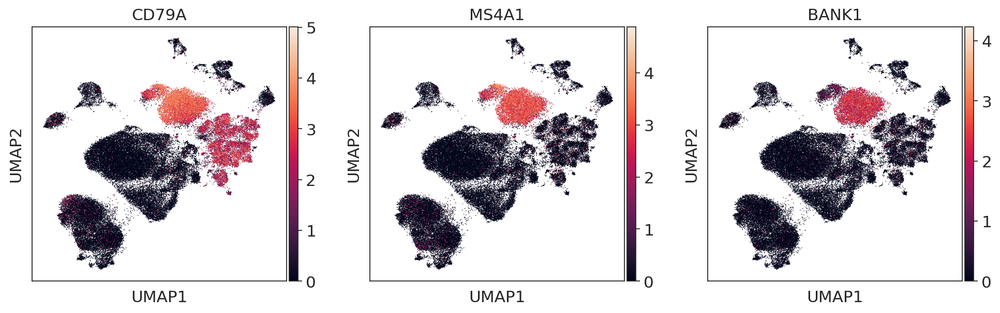

In [ ]:
sc.pl.umap(adata, color=['CD79A','MS4A1','BANK1'],)

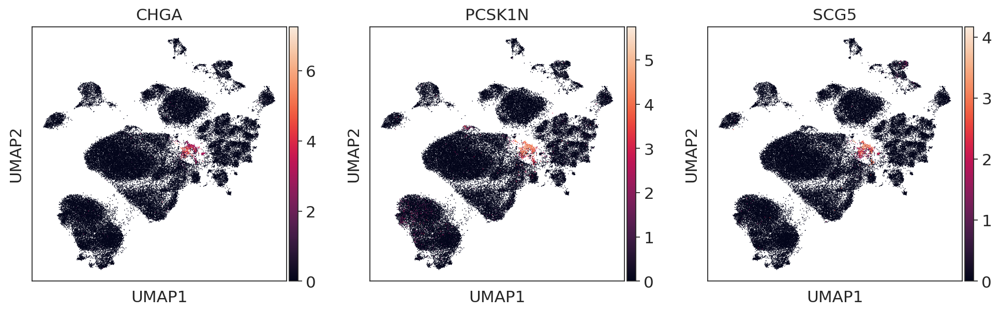

In [ ]:
sc.pl.umap(adata, color=['CHGA','PCSK1N','SCG5'],)

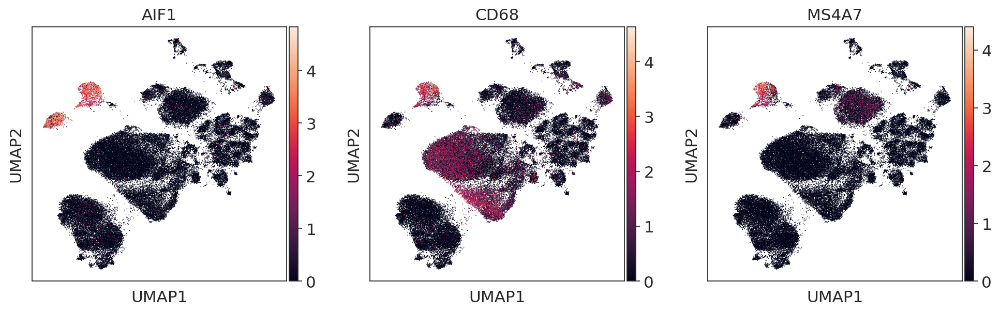

In [ ]:
sc.pl.umap(adata, color=['AIF1','CD68','MS4A7'],)

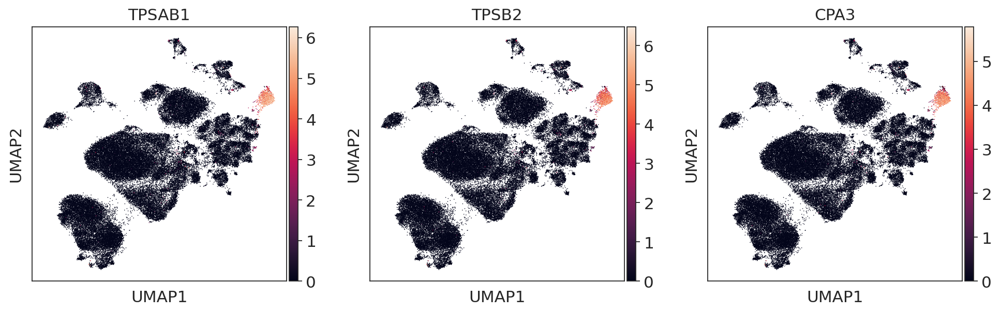

In [ ]:
sc.pl.umap(adata, color=['TPSAB1','TPSB2','CPA3'],)

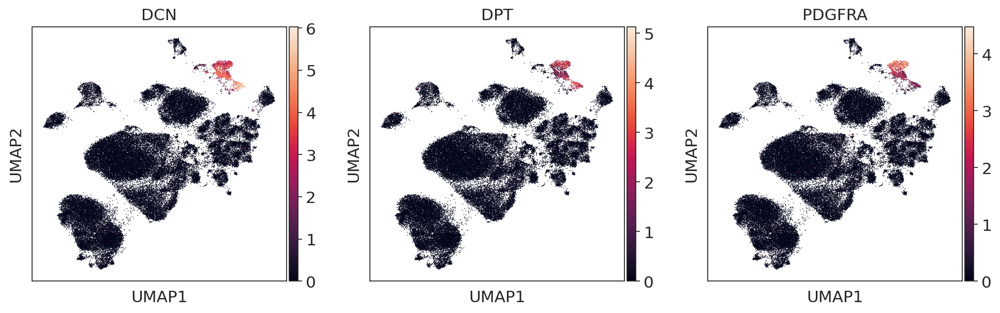

In [ ]:
sc.pl.umap(adata, color=['DCN','DPT','PDGFRA'],)

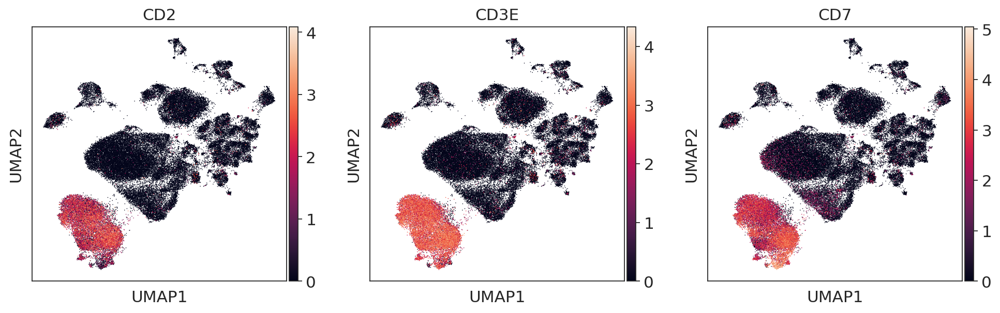

In [ ]:
sc.pl.umap(adata, color=['CD2','CD3E','CD7'],)

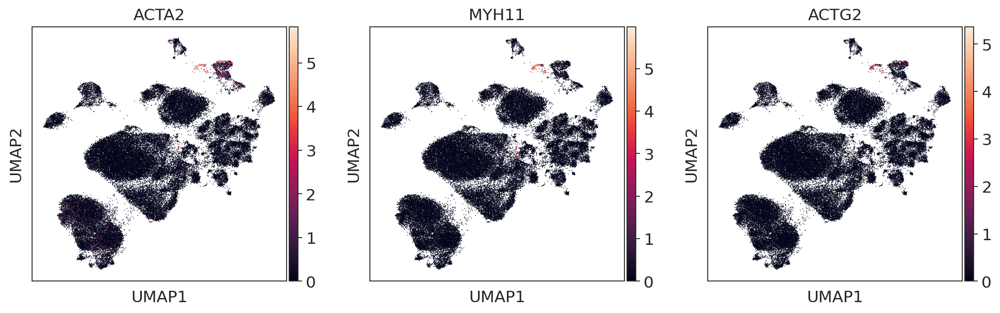

In [ ]:
sc.pl.umap(adata, color=['ACTA2','MYH11','ACTG2'],)

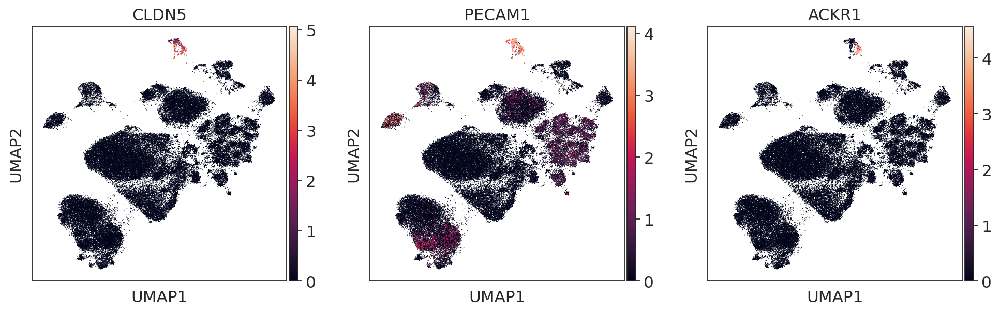

In [ ]:
sc.pl.umap(adata, color=['CLDN5','PECAM1','ACKR1'],)

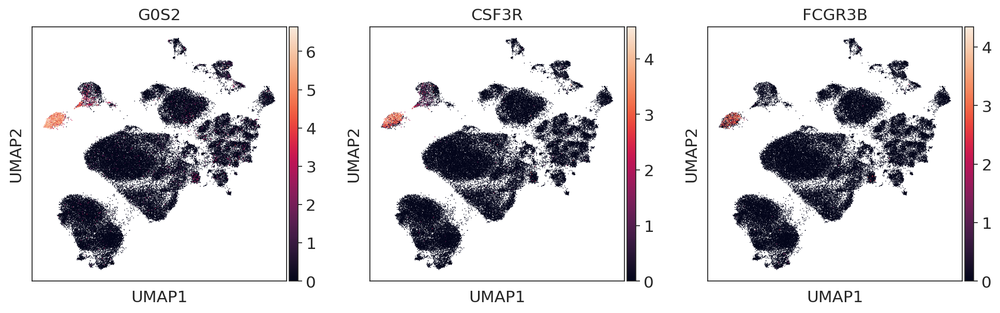

In [ ]:
sc.pl.umap(adata, color=['G0S2','CSF3R','FCGR3B'],)

# Save Data

In [ ]:
#adata = sc.read_h5ad('/content/drive/MyDrive/Gastric/Data/Gastric_anno.h5ad')
#adata

In [ ]:
adata

AnnData object with n_obs × n_vars = 63398 × 2000
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden', 'major_celltype'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'dendrogram_Group_number', 'pca', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'Group_number_colors', 'Sample_colors', 'dendrogram_leiden', 'major_celltype_colors', 'dendrogram_major_celltype'
    obsm: 'X_scVI', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [ ]:
adata.obs['Person']=''
adata.obs.loc[adata.obs['Group_number']=='HWJ','Person']='Neg_1'
adata.obs.loc[adata.obs['Group_number']=='WXY','Person']='Neg_2'
adata.obs.loc[adata.obs['Group_number']=='GXY','Person']='Neg_3'
adata.obs.loc[adata.obs['Group_number']=='DYM','Person']='Pos_1'
adata.obs.loc[adata.obs['Group_number']=='XRP','Person']='Pos_2'
adata.obs.loc[adata.obs['Group_number']=='QZW','Person']='Pos_3'
adata.obs.loc[adata.obs['Group_number']=='RJJ','Person']='Pos_4'
adata.obs.loc[adata.obs['Group_number']=='LLC','Person']='Pos_5'
adata.obs.loc[adata.obs['Group_number']=='XYM','Person']='Pos_6'
adata.obs.loc[adata.obs['Group_number']=='PC02','Person']='Para_1'
adata.obs.loc[adata.obs['Group_number']=='PC09','Person']='Para_2'

In [ ]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {
    'POS': 'Pos',
    'NEG': 'Neg',
    'Paratumor': 'Para',
}
adata.obs['Sample'] = adata.obs['Sample'].map(cluster2annotation).astype('category')

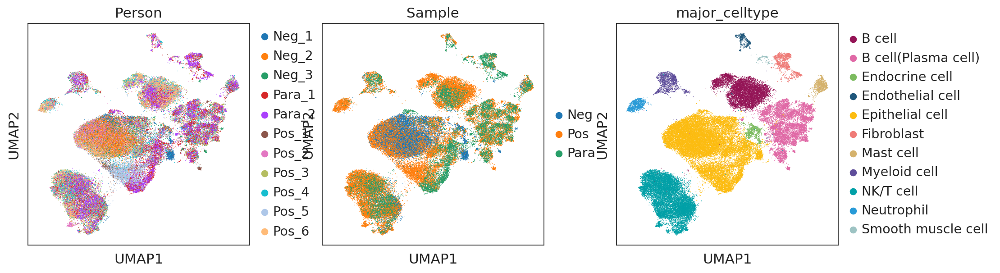

In [ ]:
sc.pl.umap(adata,color=['Person','Sample','major_celltype'])

In [ ]:
adata.write('/content/drive/MyDrive/Gastric/Data/Gastric_anno.h5ad',compression='gzip')

In [ ]:
Origin_adata = sc.read('/content/drive/MyDrive/Gastric/Data/Gastric_Origin_new.h5ad')
Origin_adata

AnnData object with n_obs × n_vars = 63786 × 32559
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts'

In [ ]:
Origin_adata.X.max()

31811.0

In [ ]:
Origin_adata = Origin_adata[adata.obs.index,:]
Origin_adata

View of AnnData object with n_obs × n_vars = 63398 × 32559
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts'

In [ ]:
Origin_adata.obs = adata.obs
Origin_adata.obsm = adata.obsm
Origin_adata.uns = adata.uns
Origin_adata.obsp = adata.obsp
Origin_adata

AnnData object with n_obs × n_vars = 63398 × 32559
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden', 'major_celltype', 'Person'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'dendrogram_Group_number', 'pca', 'leiden', 'paga', 'leiden_sizes', 'umap', 'leiden_colors', 'Group_number_colors', 'Sample_colors', 'dendrogram_leiden', 'major_celltype_colors', 'dendrogram_major_celltype', 'Person_colors'
    obsm: 'X_scVI', 'X_pca', 'X_umap'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [ ]:
Origin_adata.write('/content/drive/MyDrive/Gastric/Data/Gastric_Origin.h5ad',compression='gzip')